# Расчет линии домов: первая или внутриквартальная

**Гипотеза: если полигоны закрытой тесселяции зданий (т.е. ограниченные дорожной сетью) соприкасаются с дорожной сетью уровня motorway, trunk, primary, secondary, tertiary, то значит здание находится на первой линии, если нет соприкосновения - здание находится на второй линии.**


In [ ]:
# ! pip install shapely
# ! pip install osmnx
# ! pip install momepy
# ! pip install geopandas
# ! pip install pandas
# ! pip install numpy
# ! pip install matplotlib
# ! pip install folium
# ! pip install mapclassify

In [ ]:
# ! pip install shapely==1.8.5.post1
# ! pip install osmnx==1.3.0
# ! pip install momepy==0.6.0
# ! pip install geopandas==0.12.2
# ! pip install pandas==1.3.4
# ! pip install numpy==1.20.3
# ! pip install matplotlib
# ! pip install folium
# ! pip install mapclassify

In [1]:
# импорт библиотек
import osmnx as ox
import momepy as mm
import geopandas as gpd
import pandas as pd
import numpy as np
import folium
from mapclassify import classify
from matplotlib import pyplot as plt
import shapely
from shapely.geometry import Polygon, LineString, MultiPoint, Point

In [2]:
ox.__version__

'1.9.1'

In [3]:
shapely.__version__

'2.0.2'

In [4]:
mm.__version__

'0.7.0'

In [5]:
# загрузка из OSM зданий внутри границ города
gdf = ox.geometries.geometries_from_place('Kahla, Germany', tags={'building':True}) #

C:\Users\Asus\AppData\Local\Temp\ipykernel_18436\2177612656.py:2: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release.
  gdf = ox.geometries.geometries_from_place('Kahla, Germany', tags={'building':True}) #


In [6]:
# проецирование в UTM зону геодатафрейма со зданиями
gdf_projected = ox.projection.project_gdf(gdf)

In [7]:
gdf_projected = gdf_projected[~gdf_projected.geometry.is_empty]

<Axes: >

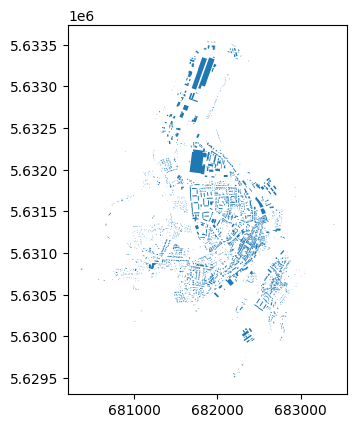

In [8]:
gdf_projected.plot()

In [9]:
gdf_projected.index

MultiIndex([('way',   45059580),
            ('way',   87337221),
            ('way',   87337222),
            ('way',   87337224),
            ('way',   87337225),
            ('way',   87337226),
            ('way',   87337230),
            ('way',   87337233),
            ('way',   87339964),
            ('way',   87371536),
            ...
            ('way', 1110828827),
            ('way', 1110828828),
            ('way', 1110828829),
            ('way', 1110828830),
            ('way', 1110828831),
            ('way', 1110828832),
            ('way', 1112005241),
            ('way', 1112005242),
            ('way', 1112005243),
            ('way', 1112005244)],
           names=['element_type', 'osmid'], length=3013)

In [10]:
# подготовка полигонов со зданиями для дальнейшей работы
buildings = mm.preprocess(gdf_projected, size=30,compactness=0.2, islands=True, verbose=False)

C:\Users\Asus\anaconda3\envs\geo\Lib\site-packages\momepy\preprocessing.py:84: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  sw = libpysal.weights.contiguity.Rook.from_dataframe(blg, silence_warnings=True)
C:\Users\Asus\anaconda3\envs\geo\Lib\site-packages\momepy\preprocessing.py:84: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  sw = libpysal.weights.contiguity.Rook.from_dataframe(blg, silence_warnings=True)


In [11]:
# загрузка из OSM дорожной сети внутри границ города
streets_graph = ox.graph_from_place('Kahla, Germany', network_type='drive') # Kahla, Germany

In [12]:
# проецирование в UTM зону геодатафрейма с дорожной сетью
streets_graph = ox.projection.project_graph(streets_graph)

In [13]:
# создание геодатафрейма дорожной сети из графа
streets = ox.graph_to_gdfs(streets_graph, nodes=False, edges=True, node_geometry=False, fill_edge_geometry=True)

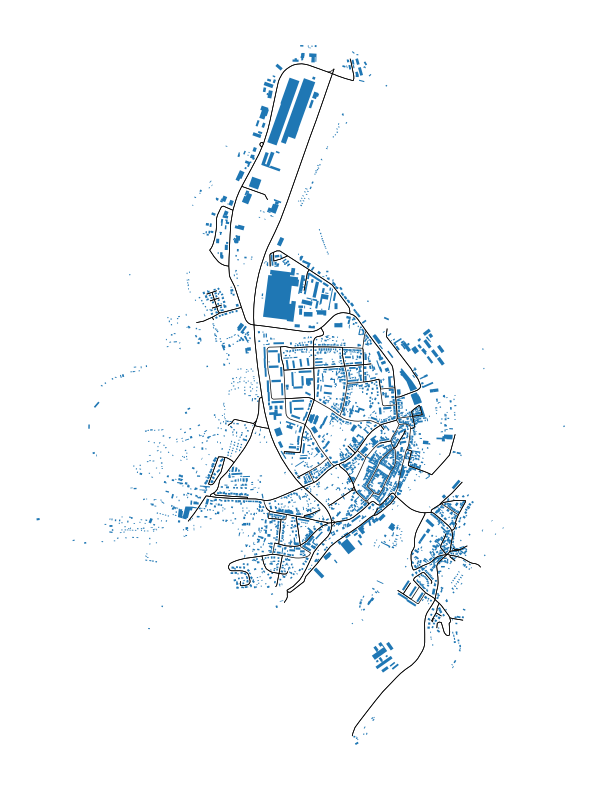

In [14]:
# визуализация дорожной сети и зданий
ax = buildings.plot(figsize=(10, 10))
streets.plot(ax=ax, color='k', linewidth=.5)
ax.set_axis_off()

In [15]:
# задаем ограничение для прорисовки полигонов тесселяции зданий
limit = mm.buffered_limit(buildings)

In [16]:
# создаем полигоны пересечений улиц
enclosures = mm.enclosures(streets, limit=gpd.GeoSeries([limit]))

C:\Users\Asus\anaconda3\envs\geo\Lib\site-packages\geopandas\array.py:1459: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 32N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


<Axes: >

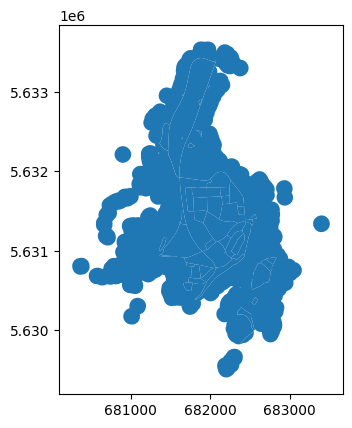

In [17]:
enclosures.plot()

In [18]:
df_streets = streets.reset_index()

In [19]:
df_streets

,u,v,key,osmid,name,highway,maxspeed,oneway,reversed,length,lanes,ref,geometry,bridge
0,31918054,313327901,0,154934607,Gerberstraße,residential,20,False,False,6.545,NaN,NaN,"LINESTRING (681804.922 5630396.235, 681806.646...",NaN
1,31918054,1583262490,0,"[370409322, 370409324]",Rudolstädter Straße,primary,50,False,True,456.417,"[3, 2]",B 88,"LINESTRING (681804.922 5630396.235, 681840.863...",NaN
2,313327901,31918054,0,154934607,Gerberstraße,residential,20,False,True,6.545,NaN,NaN,"LINESTRING (681806.646 5630389.917, 681804.922...",NaN
3,313327901,1673865104,0,154934607,Gerberstraße,residential,20,False,False,679.145,NaN,NaN,"LINESTRING (681806.646 5630389.917, 681815.533...",NaN
4,313327901,313328313,0,"[154934608, 363472734]",Rudolstädter Straße,residential,NaN,False,False,70.289,NaN,NaN,"LINESTRING (681806.646 5630389.917, 681806.472...",NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
390,2179857603,2179857601,0,207735308,Am Aschborn,residential,NaN,False,False,32.753,NaN,NaN,"LINESTRING (681373.057 5632112.685, 681341.840...",NaN
391,2179857599,2179857594,0,207735312,Am Aschborn,residential,NaN,False,True,29.405,NaN,NaN,"LINESTRING (681414.507 5632080.613, 681386.452...",NaN
392,2179857601,2179857603,0,207735308,Am Aschborn,residential,NaN,False,True,32.753,NaN,NaN,"LINESTRING (681341.840 5632102.458, 681373.057...",NaN
393,2179857606,2179857603,0,154934582,Am Aschborn,residential,NaN,False,False,28.886,NaN,NaN,"LINESTRING (681400.427 5632122.176, 681373.057...",NaN


In [20]:
buildings['uID'] = mm.unique_id(buildings)

In [21]:
enclosed_tess = mm.Tessellation(buildings, unique_id='uID',enclosures=enclosures).tessellation

C:\Users\Asus\anaconda3\envs\geo\Lib\site-packages\momepy\elements.py:451: FutureWarning: The `query_bulk()` method is deprecated and will be removed in GeoPandas 1.0. You can use the `query()` method instead.
  inp, res = buildings.sindex.query_bulk(
C:\Users\Asus\AppData\Local\Temp\ipykernel_18436\3524002744.py:1: UserWarning: dask.dataframe could not be imported. Setting `use_dask=False`.
  enclosed_tess = mm.Tessellation(buildings, unique_id='uID',enclosures=enclosures).tessellation


In [22]:
enclosed_tess.shape

(2580, 3)

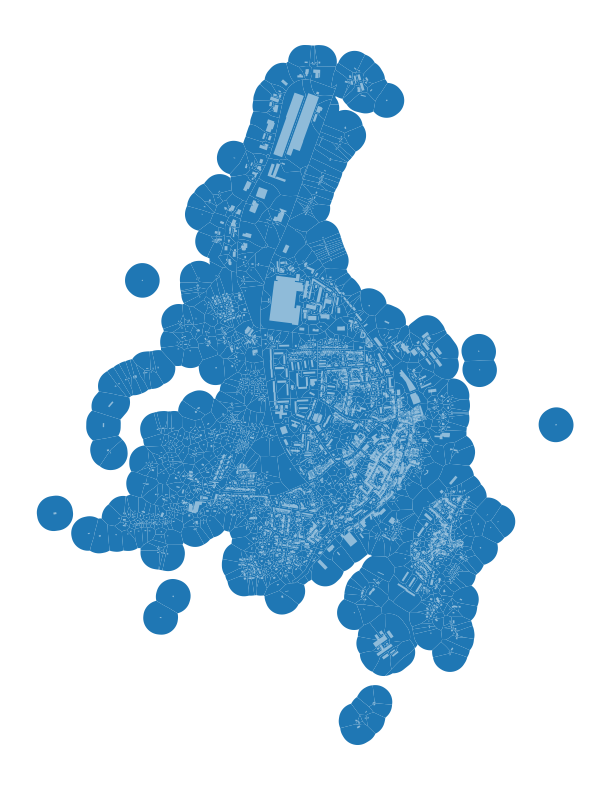

In [23]:
ax = enclosed_tess.plot(figsize=(10, 10))
buildings.plot(ax=ax, color='white', alpha=.5)
ax.set_axis_off()

(5631000.0, 5632000.0)

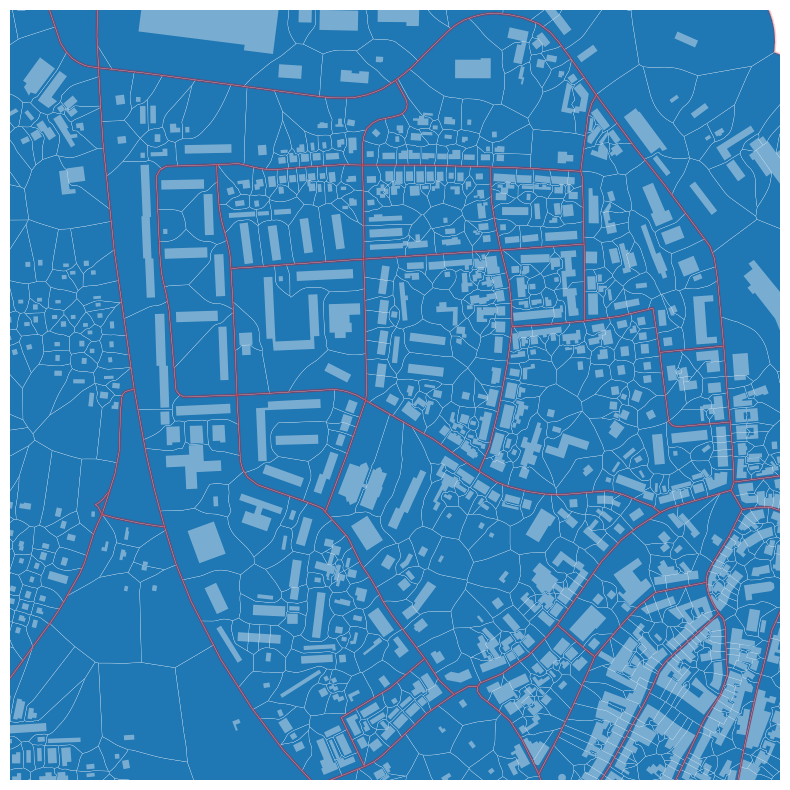

In [24]:
# визуализируем  границы enclosed tesselations и enclosures (красная линия)
ax = enclosed_tess.plot(edgecolor='white', linewidth=0.2, figsize=(10, 10))
buildings.plot(ax=ax, color='white', alpha=.5)
enclosures.plot(ax=ax, edgecolor='red', linewidth=2, alpha=.2)
ax.set_axis_off()
ax.set_xlim(681500, 682500)
ax.set_ylim(5631000, 5632000)

In [25]:
enclosed_tess

,uID,geometry,eID
0,1373.0,"POLYGON ((681928.695 5630536.070, 681928.721 5...",0
1,1370.0,"POLYGON ((681949.898 5630592.392, 681950.869 5...",0
2,1365.0,"POLYGON ((682027.202 5630639.526, 682027.100 5...",0
3,1371.0,"POLYGON ((681930.699 5630535.484, 681929.697 5...",0
4,1368.0,"POLYGON ((681964.672 5630620.573, 681965.876 5...",0
...,...,...,...
2575,NaN,"POLYGON ((681852.809 5632875.693, 681853.585 5...",56
2576,NaN,"POLYGON ((682369.443 5630544.364, 682378.978 5...",57
2577,2153.0,"POLYGON ((680458.914 5630872.499, 680464.377 5...",58
2578,568.0,"POLYGON ((681002.891 5632199.397, 681000.911 5...",59


In [26]:
# для каждого полигона enclosed_tess найдем соприкосновение с улицами и запишем в датафрейм
lst = []
for index, row in enclosed_tess.iterrows():
    streets_selected = row['geometry'].touches(df_streets['geometry'])
    streets_selected_overlaps = row['geometry'].overlaps(df_streets['geometry'].buffer(1))
    df_streets_selected = list(set(list(df_streets[streets_selected].index) + list(df_streets[streets_selected_overlaps].index)))
    enclosure_tess_index = index
    street_index = df_streets_selected
    l = [enclosure_tess_index, street_index]
    lst.append(l)

df_enclosure_tess_index = pd.DataFrame(lst, columns = ['enclosure_tess_index', 'street_indexes'])



In [27]:
df_enclosure_tess_index.street_indexes

0       [0, 129, 2, 3, 4, 1, 7, 50]
1                     [1, 50, 3, 7]
2                           [50, 3]
3                     [1, 50, 3, 7]
4                     [1, 50, 3, 7]
                   ...             
2575                     [290, 306]
2576                             []
2577                             []
2578                             []
2579                             []
Name: street_indexes, Length: 2580, dtype: object

In [28]:
df_streets

,u,v,key,osmid,name,highway,maxspeed,oneway,reversed,length,lanes,ref,geometry,bridge
0,31918054,313327901,0,154934607,Gerberstraße,residential,20,False,False,6.545,NaN,NaN,"LINESTRING (681804.922 5630396.235, 681806.646...",NaN
1,31918054,1583262490,0,"[370409322, 370409324]",Rudolstädter Straße,primary,50,False,True,456.417,"[3, 2]",B 88,"LINESTRING (681804.922 5630396.235, 681840.863...",NaN
2,313327901,31918054,0,154934607,Gerberstraße,residential,20,False,True,6.545,NaN,NaN,"LINESTRING (681806.646 5630389.917, 681804.922...",NaN
3,313327901,1673865104,0,154934607,Gerberstraße,residential,20,False,False,679.145,NaN,NaN,"LINESTRING (681806.646 5630389.917, 681815.533...",NaN
4,313327901,313328313,0,"[154934608, 363472734]",Rudolstädter Straße,residential,NaN,False,False,70.289,NaN,NaN,"LINESTRING (681806.646 5630389.917, 681806.472...",NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
390,2179857603,2179857601,0,207735308,Am Aschborn,residential,NaN,False,False,32.753,NaN,NaN,"LINESTRING (681373.057 5632112.685, 681341.840...",NaN
391,2179857599,2179857594,0,207735312,Am Aschborn,residential,NaN,False,True,29.405,NaN,NaN,"LINESTRING (681414.507 5632080.613, 681386.452...",NaN
392,2179857601,2179857603,0,207735308,Am Aschborn,residential,NaN,False,True,32.753,NaN,NaN,"LINESTRING (681341.840 5632102.458, 681373.057...",NaN
393,2179857606,2179857603,0,154934582,Am Aschborn,residential,NaN,False,False,28.886,NaN,NaN,"LINESTRING (681400.427 5632122.176, 681373.057...",NaN


In [29]:
df_enclosure_tess_index_result = df_enclosure_tess_index.explode('street_indexes')

In [30]:
# типы дорожной сети, принадлежность к которой будет считаться 1й линией домов
first_line_street_types = ['motorway', 'trunk', 'primary', 'secondary', 'tertiary']

In [31]:
streets_eti = pd.merge(df_enclosure_tess_index_result, df_streets[['highway']], right_index=True, left_on='street_indexes', how='left')
streets_eti['is_first_line'] = streets_eti['highway'].map(lambda x: 1 if x in first_line_street_types else 0)

In [32]:
# полигоны enclosed_tess с признаком: 1 линия или нет
streets_eti_prcd = streets_eti.groupby('enclosure_tess_index').agg({'is_first_line': 'max'}).reset_index(drop=False)

In [33]:
streets_eti_prcd.describe()

,enclosure_tess_index,is_first_line
count,2580.000000,2580.000000
mean,1289.500000,0.151938
std,744.926171,0.359030
min,0.000000,0.000000
25%,644.750000,0.000000
50%,1289.500000,0.000000
75%,1934.250000,0.000000
max,2579.000000,1.000000


In [34]:
streets_eti_prcd.groupby('is_first_line').size()

is_first_line
0    2188
1     392
dtype: int64

In [35]:
df_streets.groupby('highway').size()

highway
primary            20
primary_link        1
residential       255
secondary          28
secondary_link      1
tertiary           69
unclassified       21
dtype: int64

In [36]:
enclosed_tess

,uID,geometry,eID
0,1373.0,"POLYGON ((681928.695 5630536.070, 681928.721 5...",0
1,1370.0,"POLYGON ((681949.898 5630592.392, 681950.869 5...",0
2,1365.0,"POLYGON ((682027.202 5630639.526, 682027.100 5...",0
3,1371.0,"POLYGON ((681930.699 5630535.484, 681929.697 5...",0
4,1368.0,"POLYGON ((681964.672 5630620.573, 681965.876 5...",0
...,...,...,...
2575,NaN,"POLYGON ((681852.809 5632875.693, 681853.585 5...",56
2576,NaN,"POLYGON ((682369.443 5630544.364, 682378.978 5...",57
2577,2153.0,"POLYGON ((680458.914 5630872.499, 680464.377 5...",58
2578,568.0,"POLYGON ((681002.891 5632199.397, 681000.911 5...",59


In [37]:
streets_eti_prcd

,enclosure_tess_index,is_first_line
0,0,1
1,1,1
2,2,0
3,3,1
4,4,1
...,...,...
2575,2575,1
2576,2576,0
2577,2577,0
2578,2578,0


In [38]:
# добавляем к полигонам геодатафрейма enclosed_tess признак is_first_line
result = enclosed_tess.merge(streets_eti_prcd[['is_first_line']], left_index=True, right_index=True)

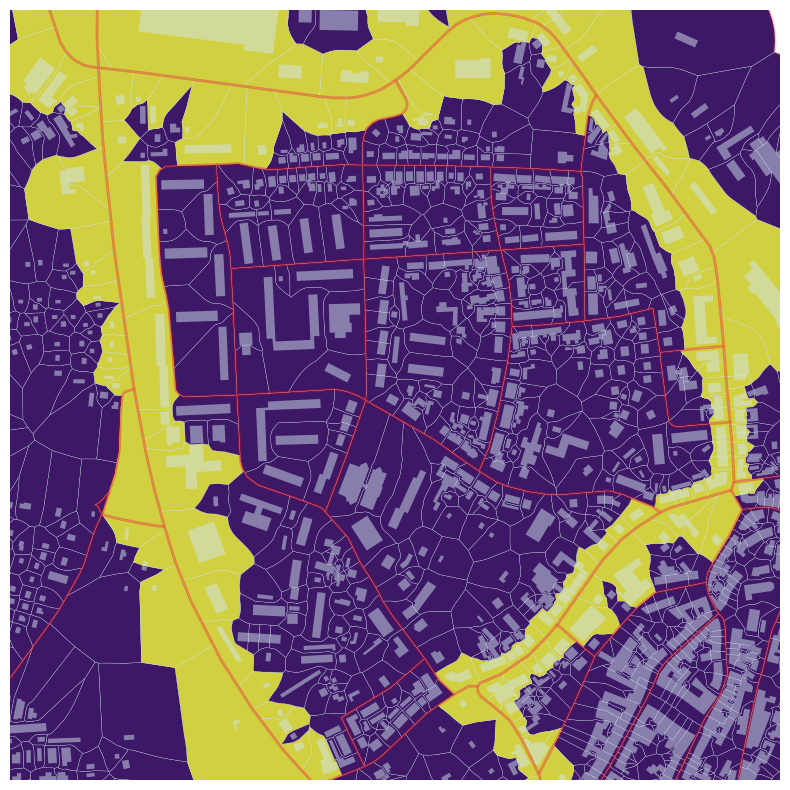

In [39]:
# визуализируем  границы enclosed tesselations и enclosures (красная линия), подсвечены полигоны, которые примыкают к улицам с типом 1
ax = result.plot(column='is_first_line', edgecolor='white', linewidth=0.2, figsize=(10, 10))
buildings.plot(ax=ax, color='white', alpha=.5)
enclosures.plot(ax=ax, edgecolor='red', linewidth=2, alpha=.2)
ax.set_xlim(681500, 682500)
ax.set_ylim(5631000, 5632000)
ax.set_axis_off()

In [40]:
gdf_start_point = result.to_crs('EPSG:4326')
start_point = gdf_start_point.geometry.unary_union.centroid.coords.xy
location = float(start_point[1][0]), start_point[0][0]

In [41]:
m = folium.Map(location=location, zoom_start=14, overlay=True, show=False)

In [42]:
folium.TileLayer('', name='Отключить слои', attr='blank').add_to(m)
df_streets.explore(m=m,
                   column='highway',
                   name='Дорожная сеть',
                   overlay=True,
                   legend=False,
                   show=True
                  )

result.explore(m=m,
               column='is_first_line',
               name = 'Первая линия домов или нет',
               overlay=True,
               legend=False,
               show=True
              )

folium.LayerControl(collapse=False).add_to(m)

In [43]:
m

# Выводы: данный подход позволяет в автоматическом режиме определять принадлежность зданий к 1й или внутриквартальной зоне